## L3c: Understanding the Role of Income, Prices and Information on Optimal Decisions

Consider a utility maximization problem with the Cobb-Douglas utility function, $U(x_{1},x_{2}) = x_{1}^{\alpha}x_{2}^{1-\alpha}$, subject to a budget constraint. 
The Lagrangian for this system is given by:

$$
\begin{equation*}
\mathcal{L}(x,\lambda) = x_{1}^{\alpha}x_{2}^{1-\alpha} + \lambda\cdot\left(I-c_{1}x_{1}-c_{2}x_{2}\right)
\end{equation*}
$$

which gives the first-order optimality conditions:

$$
\begin{eqnarray*}
\frac{\partial\mathcal{L}}{\partial{x_{1}}} & = & \alpha\cdot{x_{1}^{\alpha-1}}x_{2}^{1-\alpha} - \lambda\cdot{c_{1}} = 0 \\
\frac{\partial\mathcal{L}}{\partial{x_{2}}} & = & (1-\alpha)\cdot{x_{1}^{\alpha}x_{2}^{-\alpha}} - \lambda\cdot{c_{2}} = 0 \\
\frac{\partial\mathcal{L}}{\partial\lambda} & = & I - c_{1}x_{1} - c_{2}x_{2} = 0
\end{eqnarray*}
$$

This system of first-order optimality conditions can be solved for the optimal consumption levels of $x_{1}$ and $x_{2}$. However, it is non-linear. Thus, we often need to use numerical methods to find the optimal values of $x_{1}$ and $x_{2}$.

### Learning objectives
In this lab, we'll use a numerical approach to solve for the optimal allocation between `apples` and `oranges` for a `Cobb-Douglas` utility function. 

* First, we'll start by computing the optimal solution for a `base` set of parameters, `I = 20 USD` budget, `P&C` fruit prices, and $\alpha = [0.45,0.55]$.  Then, we'll change some of the parameters to see how the optimal solution changes.
* Next, we'll increase the budget $I\leftarrow{2}\times{I}$, and compare the perturbed solution to the `base` solution.
* Lastly, we'll visualize the budget constraint and the indifference curve and show that the numerical optimum is the interior point of tangency between the budget line and the indifference curve.

### Setup
The computations in this lab (or example) are enabled by the [VLDecisionsPackage.jl](https://github.com/varnerlab/VLDecisionsPackage.jl.git) and several external `Julia` packages. To load the required packages and any custom codes the teaching team has developed to work with these packages, we [include](https://docs.julialang.org/en/v1/manual/code-loading/) the `Include.jl` file):

In [1]:
include("Include.jl");

  Activating project at `~/Desktop/julia_work/CHEME-5760-Labs-F23`
    Updating registry at `~/.julia/registries/General.toml`
    Updating git-repo `https://github.com/varnerlab/VLDecisionsPackage.jl.git`
  No Changes to `~/Desktop/julia_work/CHEME-5760-Labs-F23/Project.toml`
  No Changes to `~/Desktop/julia_work/CHEME-5760-Labs-F23/Manifest.toml`


### Case I: What happens if we make more money?

In [2]:
# initialize -
α = [0.55, 0.45]; # coefficients
c = [0.98, 1.49]; # price of x1 and x2
total_budget = 20.0;

# build my problem object -
problem₁ = build(MySimpleCobbDouglasChoiceProblem, (
    
    initial = 0.1*ones(2), # initial guess
    α = α, # coefficients
    c = c, # price of x1 and x2
    I = total_budget, # income
    
    # how much of x₁ and x₂ can be we buy?
    bounds = [
        0.0 100.0; # L U
        0.0 100.0; # L U
    ]
));

# call the solve function. This will return a dictionary -
solution₁ = solve(problem₁);

This is MadNLP version v0.7.0, running with umfpack

Number of nonzeros in constraint Jacobian............:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0000000e-01 0.00e+00 4.71e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1 -2.4721739e-01 7.77e-16 3.35e-01  -1.0 3.61e-01    -  6.57e-01 1.00e+00h  

In [3]:
problem₂ = build(MySimpleCobbDouglasChoiceProblem, (
    
    initial = 0.1*ones(2), # initial guess
    α = α, # coefficients
    c = c, # price of x1 and x2
    I = 2.0*total_budget, # income
    
    # how much of x₁ and x₂ can be we buy?
    bounds = [
        0.0 100.0; # L U
        0.0 100.0; # L U
    ]
));

solution₂ = solve(problem₂);

This is MadNLP version v0.7.0, running with umfpack

Number of nonzeros in constraint Jacobian............:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0000000e-01 0.00e+00 4.71e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1 -2.4863747e-01 9.99e-16 3.44e-01  -1.0 3.65e-01    -  6.52e-01 1.00e+00h  

#### Visualize: `Apples` versus `Oranges` for `I = 20 USD`

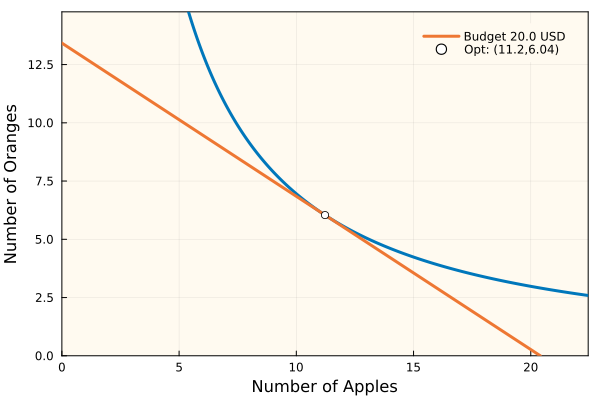

In [4]:
let problem = problem₁, solution = solution₁
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    c = problem.c;
    budget_value = problem.I;
    xlim = [0.0, 1.1*(budget_value/c[1])];
    ylim = [0.0, 1.1*(budget_value/c[2])];
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)

    # compute the budget -
    BC = budget(problem, xlim)

    # make the plots -
    plot(INC[:,1],INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=colors[3], xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end

#### Visualize: `Apples` versus `Oranges` for `I = 40 USD`

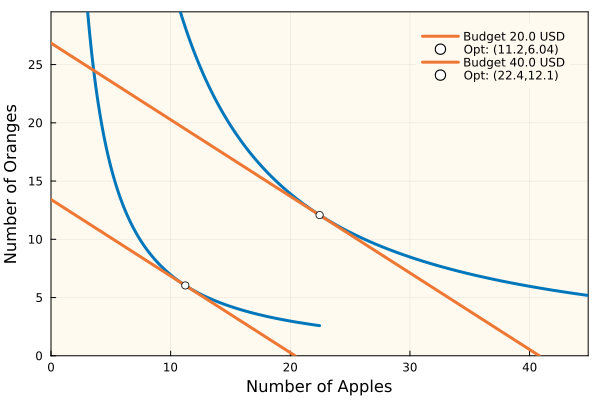

In [5]:
let problem = problem₂, solution = solution₂
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    c = problem.c;
    budget_value = problem.I;
    xlim = [0.0, 1.1*(budget_value/c[1])];
    ylim = [0.0, 1.1*(budget_value/c[2])];
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)

    # compute the budget -
    BC = budget(problem, xlim)

    # make the plots -
    plot!(INC[:,1],INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=colors[3], xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end

### Case II: What happens if the price of an `Apple` increases?

In [6]:
c₃ = [2.0*(0.98), 1.49]; # price of x1 and x2
problem₃ = build(MySimpleCobbDouglasChoiceProblem, (
    
    initial = 0.1*ones(2), # initial guess
    α = α, # coefficients
    c = c₃, # price of x1 and x2
    I = 1.0*total_budget, # income
    
    # how much of x₁ and x₂ can be we buy?
    bounds = [
        0.0 100.0; # L U
        0.0 100.0; # L U
    ]
));

solution₃ = solve(problem₃);

This is MadNLP version v0.7.0, running with umfpack

Number of nonzeros in constraint Jacobian............:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0000000e-01 0.00e+00 4.39e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1 -2.4817670e-01 6.66e-16 3.41e-01  -1.0 2.89e-01    -  6.52e-01 1.00e+00h  

In [7]:
solution₃

Dict{String, Any} with 3 entries:
  "argmax"          => [22.449, 6.04027]
  "budget"          => 20.0
  "objective_value" => 12.4346

#### Visualize: `Apples` versus `Oranges` for `I = 20 USD` and $c_{1} \leftarrow 2.0\times{c}_{1}$

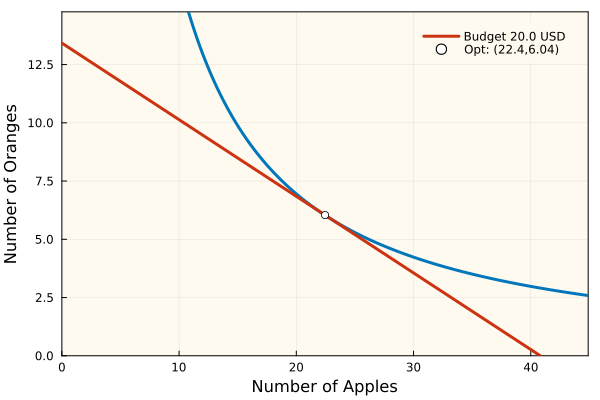

In [8]:
let problem = problem₃, solution = solution₃
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    c = problem.c;
    budget_value = problem.I;
    xlim = [0.0, 1.1*(budget_value/c[1])];
    ylim = [0.0, 1.1*(budget_value/c[2])];
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)

    # compute the budget -
    BC = budget(problem, xlim)

    # make the plots -
    plot(INC[:,1],INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=colors[4], xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end

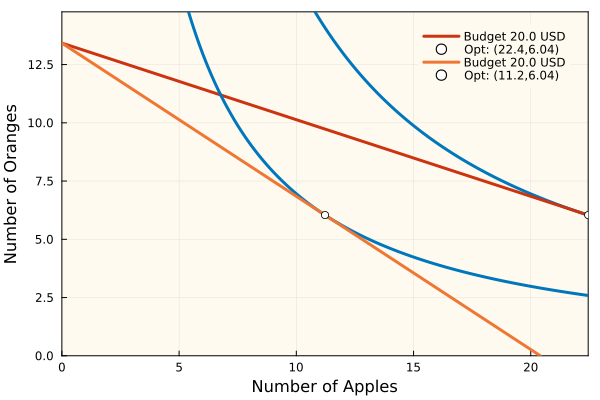

In [9]:
let problem = problem₁, solution = solution₁
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    c = problem.c;
    budget_value = problem.I;
    xlim = [0.0, 1.1*(budget_value/c[1])];
    ylim = [0.0, 1.1*(budget_value/c[2])];
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)

    # compute the budget -
    BC = budget(problem, xlim)

    # make the plots -
    plot!(INC[:,1],INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=colors[3], xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end

### Case III: What happens if my preferences change?

In [10]:
α₄ = [0.40, 0.60]; # coefficients]; # price of x1 and x2
problem₄ = build(MySimpleCobbDouglasChoiceProblem, (
    
    initial = 0.1*ones(2), # initial guess
    α = α₄, # coefficients
    c = c, # price of x1 and x2
    I = 1.0*total_budget, # income
    
    # how much of x₁ and x₂ can be we buy?
    bounds = [
        0.0 100.0; # L U
        0.0 100.0; # L U
    ]
));

solution₄ = solve(problem₄);

This is MadNLP version v0.7.0, running with umfpack

Number of nonzeros in constraint Jacobian............:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0000000e-01 0.00e+00 4.53e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1 -2.4803057e-01 2.22e-16 3.45e-01  -1.0 3.66e-01    -  6.46e-01 1.00e+00h  

In [11]:
solution₄

Dict{String, Any} with 3 entries:
  "argmax"          => [8.16327, 8.05369]
  "budget"          => 20.0
  "objective_value" => 8.09734

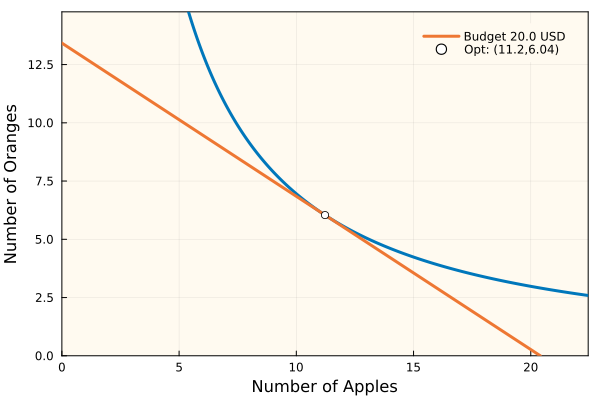

In [12]:
let problem = problem₁, solution = solution₁
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    c = problem.c;
    budget_value = problem.I;
    xlim = [0.0, 1.1*(budget_value/c[1])];
    ylim = [0.0, 1.1*(budget_value/c[2])];
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)

    # compute the budget -
    BC = budget(problem, xlim)

    # make the plots -
    plot(INC[:,1],INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=colors[3], xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end

xopt = [8.163265383705351, 8.05369134573759]


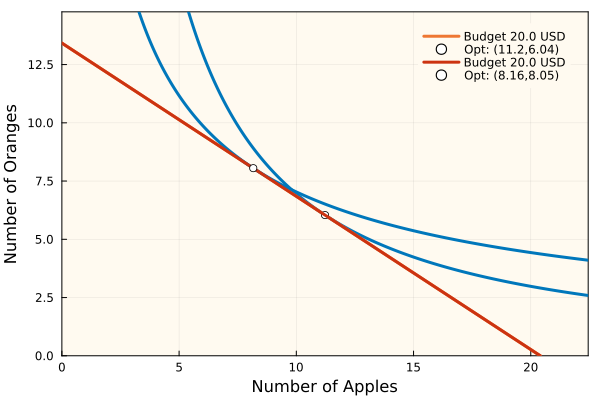

In [13]:
let problem = problem₄, solution = solution₄
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    
    @show xopt
    
    c = problem.c;
    budget_value = problem.I;
    xlim = [0.0, 1.1*(budget_value/c[1])];
    ylim = [0.0, 1.1*(budget_value/c[2])];
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)

    # compute the budget -
    BC = budget(problem, xlim)

    # make the plots -
    plot!(INC[:,1],INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=colors[4], xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[3], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end